# Imports

In [2]:
import sys, os, json
SEED = 42
PROJECT_PATH = '/datastore/researchdata/mnt/lcedillo/SPIE_trifun_net/'
sys.path.append(PROJECT_PATH)
ROOT_DIR = PROJECT_PATH
here = os.path.join(ROOT_DIR, 'notebooks')
VAE_MODEL_DIR = os.path.join(here, 'data', 'notebook_MVAE_BGNORM_{}')

In [3]:
import numpy as np
import tensorflow as tf
import keras
from keras.models import Sequential
from keras import layers, regularizers, Model, ops, optimizers
from skimage.transform import resize
from tqdm import tqdm
import matplotlib.pyplot as plt
from src.utils.visualize_image_dimensions import visualize_image_dimensions
from src.utils.visualize_class_samples import visualize_class_samples
from src.utils.analyze_data_splits import analyze_data_splits
from src.utils.plot_training_history import plot_training_history
from src.utils.classification_performance_summary import classification_performance_summary
from src.utils.visualize_latent_space_2d import visualize_latent_space_2d
from src.utils.clustering_classifier import ClusteringClassifier
from src.utils.cluster_and_evaluate import cluster_and_evaluate
from src.utils.visualize_clusters import visualize_clusters
from src.constants import BATCH_SIZE, LEARNING_RATE, EPOCHS

# Data

In [4]:
class NumpyDataLoader:
    def __init__(self, fold_idx):
        # Load data
        self.img_features = np.load(os.path.join(here, 'data', 'numpy_vectors', 'x_raw_slitless_spectro_single_channel_images.npy')).astype(np.float32)
        self.img_labels = np.load(os.path.join(here, 'data', 'numpy_vectors', 'y_satellite_string_class_labels.npy'))

        # Load folds
        self.train_fold = np.load(os.path.join(here, 'data', 'numpy_folds', f'train_indices_fold_{fold_idx}.npy'))
        self.val_fold = np.load(os.path.join(here, 'data', 'numpy_folds', f'val_indices_fold_{fold_idx}.npy'))
        self.test_fold = np.load(os.path.join(here, 'data', 'numpy_folds', f'test_indices_fold_{fold_idx}.npy'))

    def load_training_data(self):
        # Return training data
        return self.img_features[self.train_fold], self.img_labels[self.train_fold]

    def load_validation_data(self):
        # Return validation data
        return self.img_features[self.val_fold], self.img_labels[self.val_fold]

    def load_testing_data(self):
        # Return test data
        return self.img_features[self.test_fold], self.img_labels[self.test_fold]

In [5]:
# Load data
data_loader = NumpyDataLoader('X')
x_train, y_train = data_loader.load_training_data()
x_val, y_val = data_loader.load_validation_data()
x_test, y_test = data_loader.load_testing_data()
del data_loader
print(x_train.shape, x_val.shape, x_test.shape)
print(y_train.shape, y_val.shape, y_test.shape)
print(np.unique(y_train))

(1464, 200, 1340) (163, 200, 1340) (407, 200, 1340)
(1464,) (163,) (407,)
['21639' '21765' '23653' '25126' '25785' '25900' '26715' '34265'
 'flat_red']


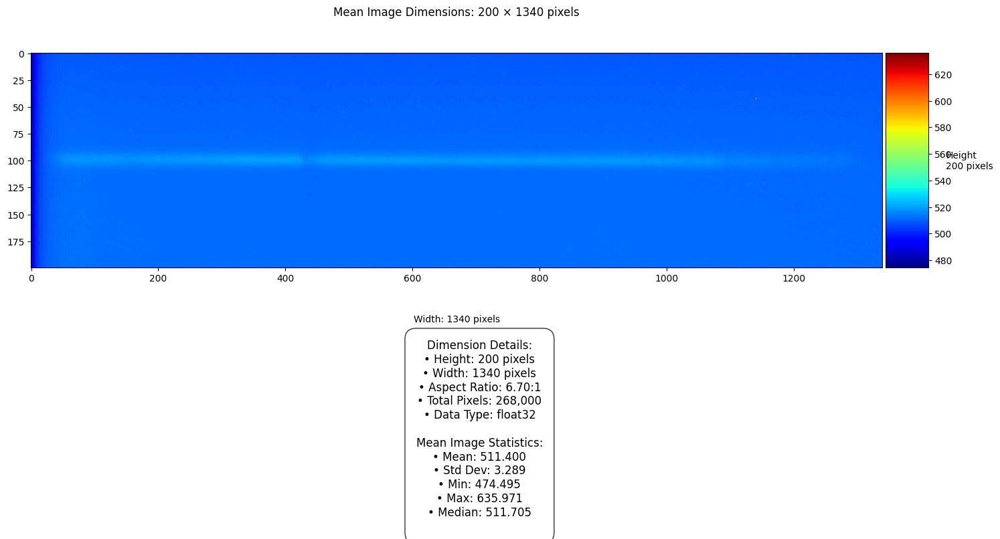

<Figure size 640x480 with 0 Axes>

In [6]:
visualize_image_dimensions(x_train)

## Split

The dataset was divided into three parts: 80% for training, 10% for validation, and 20% for testing.

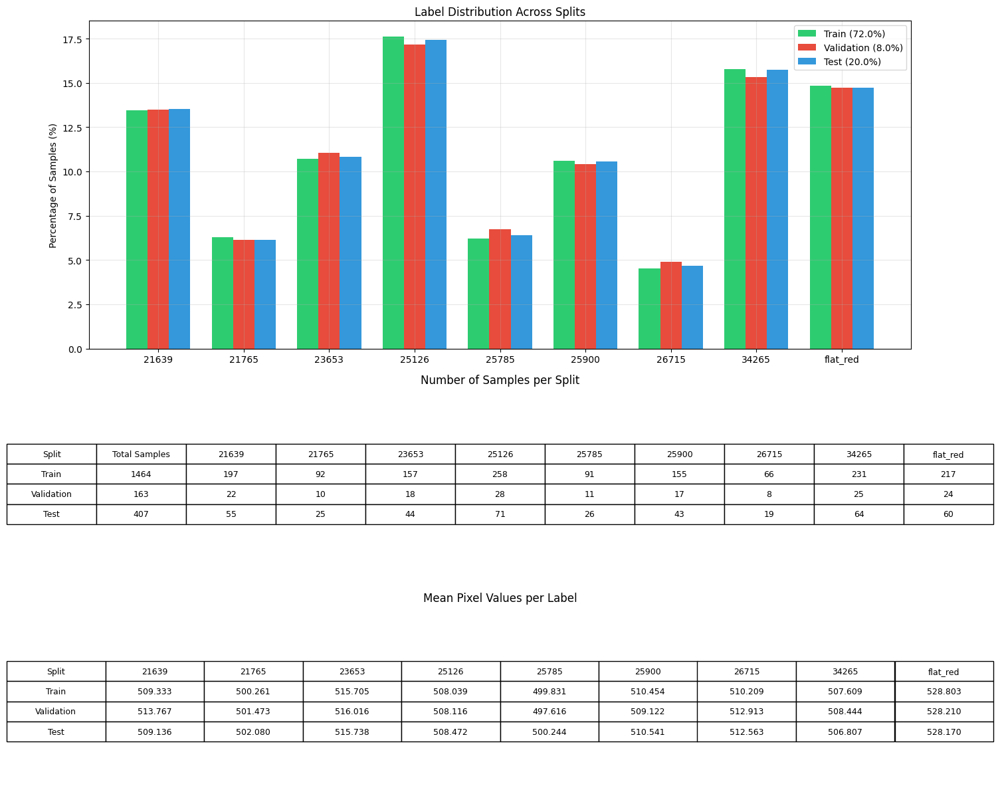

<Figure size 640x480 with 0 Axes>

In [7]:
analyze_data_splits(x_train, y_train, x_val, y_val, x_test, y_test)

Some example slitless-spectographs:

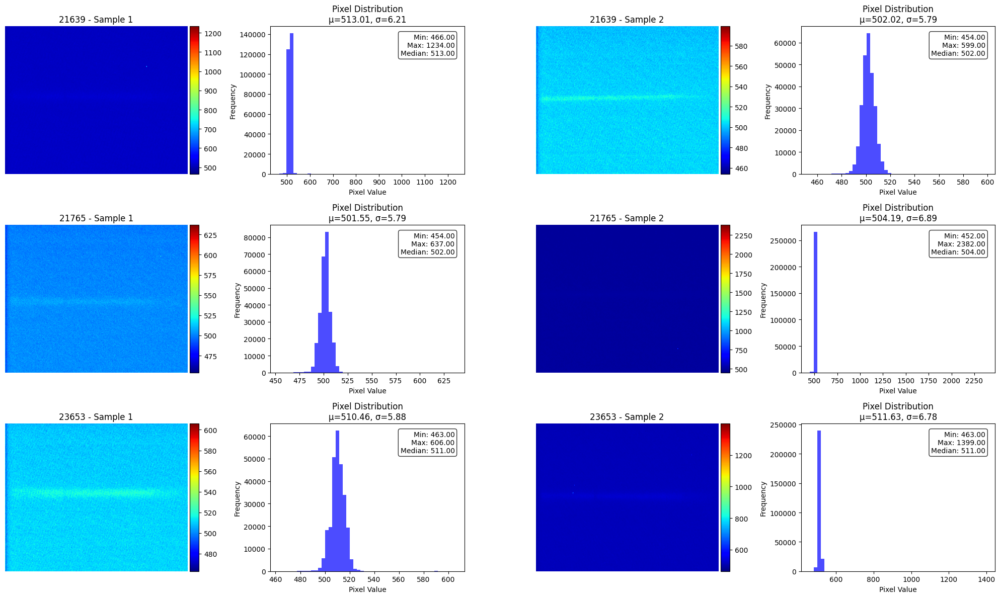

<Figure size 640x480 with 0 Axes>

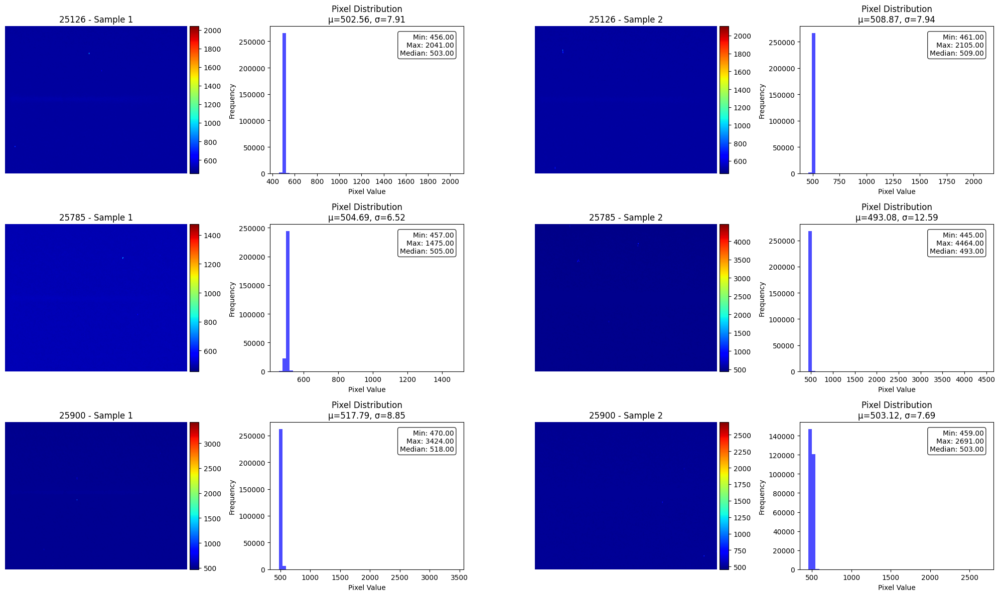

<Figure size 640x480 with 0 Axes>

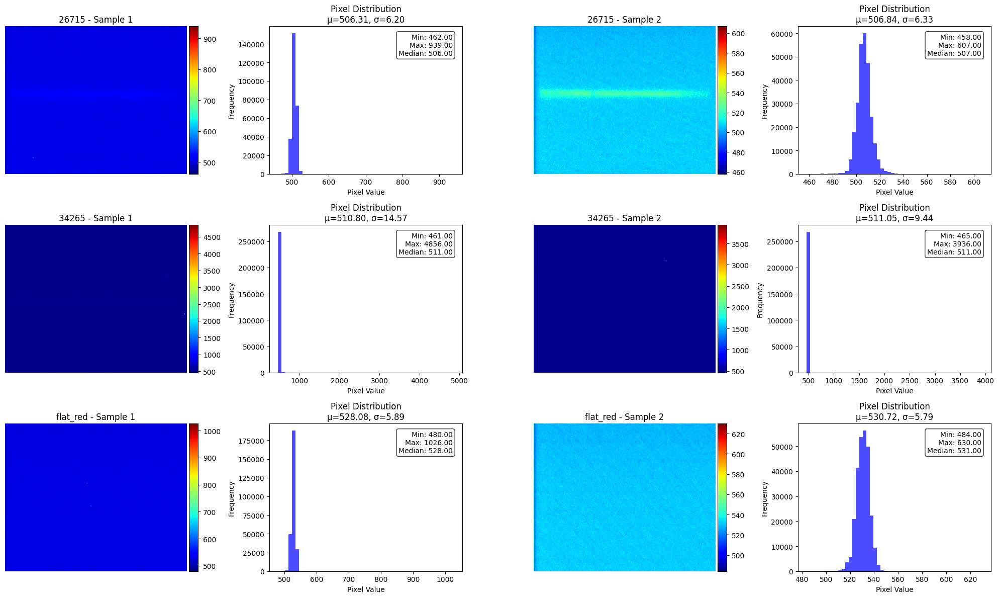

<Figure size 640x480 with 0 Axes>

In [8]:
selected_indices = visualize_class_samples(x_train, y_train)

# Preprocessing Slitless

## Min-Max Scaling

In [9]:
# Calculate target background level from training set
target_background = np.median(x_train)

# Background normalization (training set)
for i in tqdm(range(x_train.shape[0])):
    current_background = np.median(x_train[i])
    shift = target_background - current_background
    x_train[i] += shift

# Background normalization (validation set)
for i in tqdm(range(x_val.shape[0])):
    current_background = np.median(x_val[i])
    shift = target_background - current_background
    x_val[i] += shift

# Background normalization (testing set)
for i in tqdm(range(x_test.shape[0])):
    current_background = np.median(x_test[i])
    shift = target_background - current_background
    x_test[i] += shift

# clip
p1, p99 = np.percentile(x_train, (0.2, 99.8))
x_train = np.clip(x_train, p1, p99)
x_val = np.clip(x_val, p1, p99)
x_test = np.clip(x_test, p1, p99)

# minmax scaling
x_train = (x_train - p1) / (p99 - p1)
x_val = (x_val - p1) / (p99 - p1)
x_test = (x_test - p1) / (p99 - p1)

100%|██████████| 407/407 [00:01<00:00, 332.92it/s]


Some examples after prep:

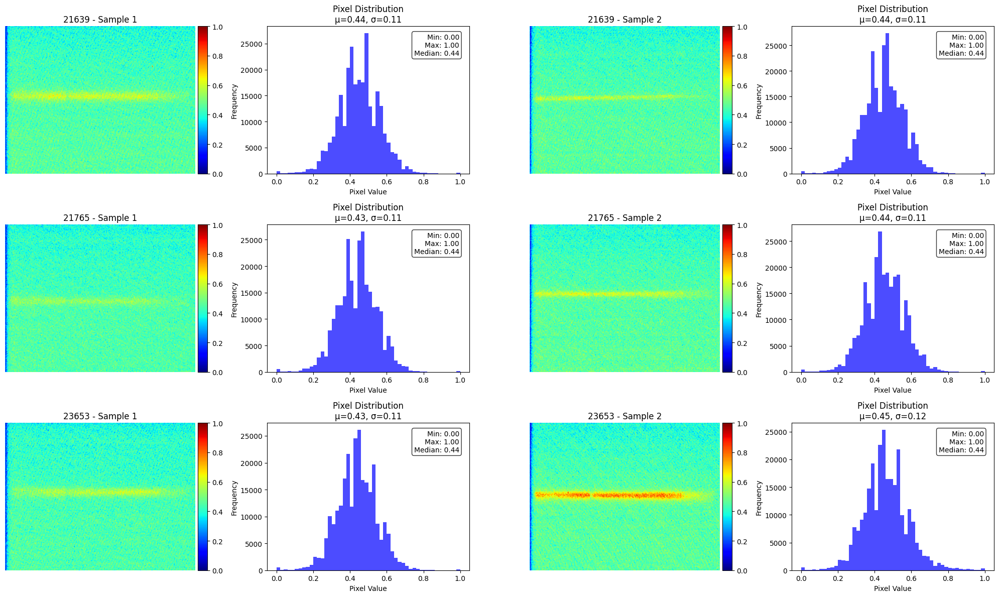

<Figure size 640x480 with 0 Axes>

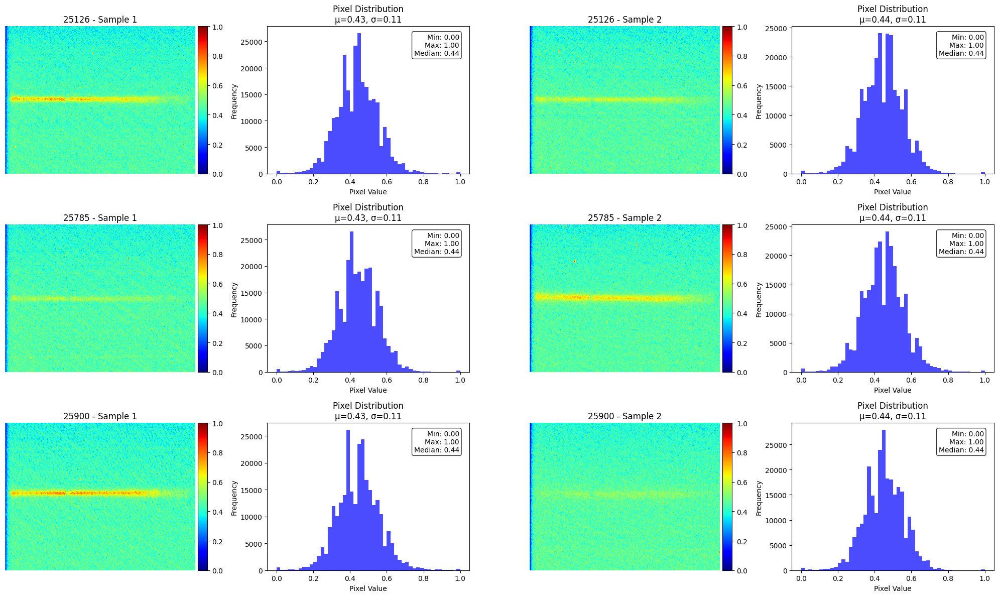

<Figure size 640x480 with 0 Axes>

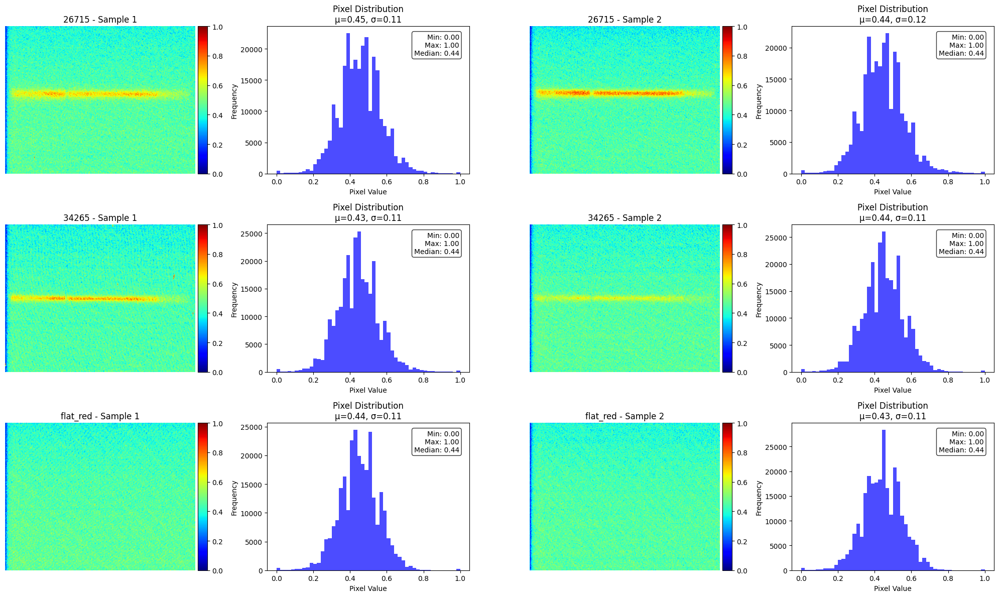

<Figure size 640x480 with 0 Axes>

In [10]:
selected_indices = visualize_class_samples(x_train, y_train, selected_indices_arr=selected_indices)

## Encoding labels

In [11]:
class StringLabelEncoder:
    def __init__(self):
        self.classes_ = None
        self.class_to_index = None
        self.index_to_class = None

    def fit(self, y):
        self.classes_ = np.unique(y)
        self.class_to_index = {cls: i for i, cls in enumerate(self.classes_)}
        self.index_to_class = {i: cls for i, cls in enumerate(self.classes_)}
        return self

    def transform(self, y):
        return np.array([self.class_to_index[cls] for cls in y])

    def inverse_transform(self, y):
        return np.array([self.index_to_class[i] for i in y])

In [12]:
# Encode labels
y_encoder = StringLabelEncoder().fit(y_train)
y_train = y_encoder.transform(y_train)
y_val = y_encoder.transform(y_val)
y_test = y_encoder.transform(y_test)

## Resize

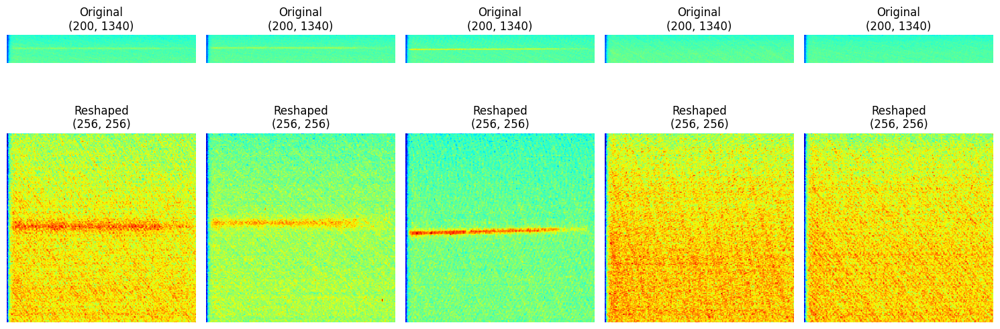

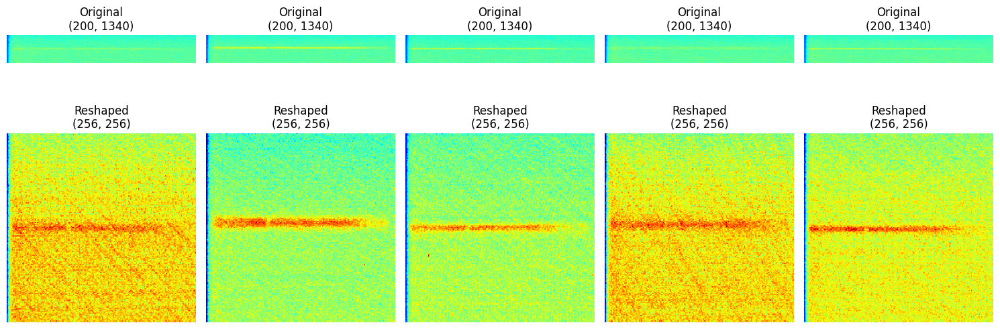

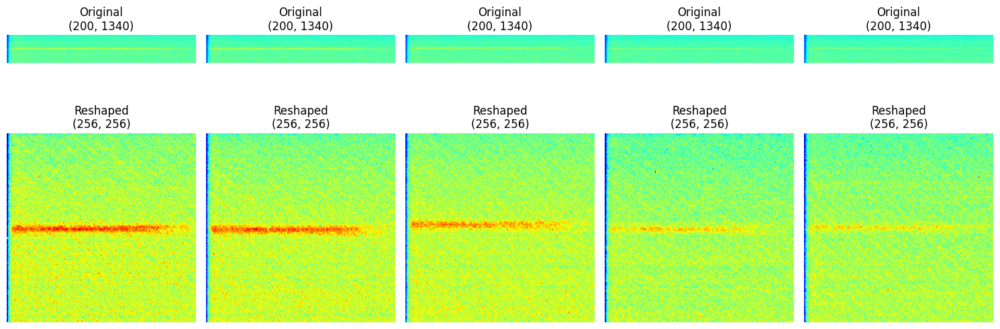

In [13]:
def reshape_and_plot_examples(x_data, n_examples=5):
    fig, axes = plt.subplots(2, n_examples, figsize=(15, 6))
    indices = np.random.choice(len(x_data), n_examples, replace=False)

    # Reshape images
    x_reshaped = np.array([
        resize(img, (256, 256), order=0, preserve_range=True)
        for img in x_data
    ])

    for i, idx in enumerate(indices):
        # Original image
        axes[0, i].imshow(x_data[idx], cmap='jet')
        axes[0, i].axis('off')
        axes[0, i].set_title(f'Original\n{x_data[idx].shape}')

        # Reshaped image
        axes[1, i].imshow(x_reshaped[idx], cmap='jet')
        axes[1, i].axis('off')
        axes[1, i].set_title(f'Reshaped\n{x_reshaped[idx].shape}')

    plt.tight_layout()
    plt.show()
    return x_reshaped

# Reshape and visualize
x_train = reshape_and_plot_examples(x_train)
x_val = reshape_and_plot_examples(x_val)
x_test = reshape_and_plot_examples(x_test)

## single channel samples

In [14]:
# ADD Channel Dimension
x_train = np.expand_dims(x_train, axis=-1)
x_val = np.expand_dims(x_val, axis=-1)
x_test = np.expand_dims(x_test, axis=-1)

# Neural Networks: Encoder, Decoder, Classifier

## Convolutional Encoder

In [15]:
LATENT_DIM = 16

In [16]:
class Sampling(layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.seed_generator = keras.random.SeedGenerator(SEED)

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = ops.shape(z_mean)[0]
        dim = ops.shape(z_mean)[1]
        epsilon = keras.random.normal(shape=(batch, dim), seed=self.seed_generator)
        return z_mean + ops.exp(0.5 * z_log_var) * epsilon

In [29]:
def define_encoder(latent_dim, input_shape):
    # Input
    encoder_inputs = keras.Input(shape=input_shape)

    # Encoder
    x = layers.Conv2D(filters=16, kernel_size=(3, 3), strides=1, padding='same', use_bias=False)(encoder_inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    x = layers.Conv2D(filters=16, kernel_size=(3, 3), strides=1, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    x = layers.MaxPooling2D(pool_size=(2, 2))(x)

    x = layers.Conv2D(filters=16, kernel_size=(3, 3), strides=1, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    x = layers.MaxPooling2D(pool_size=(4, 4))(x)
    x = layers.Flatten()(x)

    x = layers.Dense(units=128, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    x = layers.Dense(units=960, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Encoder Output
    z_mean = layers.Dense(units=latent_dim, use_bias=False)(x)
    z_log_var = layers.Dense(units=latent_dim, use_bias=False)(x)
    z = Sampling()([z_mean, z_log_var])

    # Model
    encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name='encoder')
    return encoder

In [30]:
encoder = define_encoder(LATENT_DIM, x_train.shape[1:])
encoder.summary()

Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 256, 256, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_11 (Conv2D)        │ (None, 256, 256, 16)   │            144 │ input_layer_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_25    │ (None, 256, 256, 16)   │             64 │ conv2d_11[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_26             │ (None, 256, 256, 16)   │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_12 (Conv2D)        │ (None, 256, 256, 16)   │          2,304 │ activation_26[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_26    │ (None, 256, 256, 16)   │             64 │ conv2d_12[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_27             │ (None, 256, 256, 16)   │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_6           │ (None, 128, 128, 16)   │              0 │ activation_27[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_13 (Conv2D)        │ (None, 128, 128, 16)   │          2,304 │ max_pooling2d_6[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_27    │ (None, 128, 128, 16)   │             64 │ conv2d_13[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_28             │ (None, 128, 128, 16)   │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_7           │ (None, 32, 32, 16)     │              0 │ activation_28[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_4 (Flatten)       │ (None, 16384)          │              0 │ max_pooling2d_7[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_21 (Dense)          │ (None, 128)            │      2,097,152 │ flatten_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_28    │ (None, 128)            │            512 │ dense_21[0][0]         │
│ (BatchNormalization) 

 Total params: 2,260,048 (8.62 MB)

 Trainable params: 2,257,776 (8.61 MB)

 Non-trainable params: 2,272 (8.88 KB)

## Multi-Layer Perceptron

In [31]:
def define_classifier(latent_dim, num_classes):
    # Input
    classifier_inputs = keras.Input(shape=(latent_dim,))

    # Classifier
    x = layers.Dense(units=32, use_bias=False)(classifier_inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Classifier Output
    classifier_outputs = layers.Dense(units=num_classes, activation='softmax', use_bias=False)(x)

    # Model
    classifier = keras.Model(classifier_inputs, classifier_outputs, name='classifier')
    return classifier

In [32]:
classifier = define_classifier(LATENT_DIM, np.unique(y_train).shape[0])
classifier.summary()

Model: "classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)           │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 32)                  │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_30               │ (None, 32)                  │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_31 (Activation)           │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 9)                   │             288 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 928 (3.62 KB)

 Trainable params: 864 (3.38 KB)

 Non-trainable params: 64 (256.00 B)

## Convolutional Decoder

In [33]:
def define_decoder(latent_dim):
    # Input
    decoder_inputs = keras.Input(shape=(latent_dim,))

    # Decoder
    x = layers.Dense(units=960, use_bias=False)(decoder_inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    x = layers.Dense(units=128, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    x = layers.Dense(units=16384, use_bias=False)(x)  # 32 * 32 * 16
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    x = layers.Reshape(target_shape=(32, 32, 16))(x)
    x = layers.UpSampling2D(size=(4, 4))(x)  # Now 128x128x16, mirrors MaxPooling2D

    x = layers.Conv2DTranspose(filters=16, kernel_size=(3, 3), strides=1, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    x = layers.UpSampling2D(size=(2, 2))(x)  # Now 256x256x16, mirrors MaxPooling2D

    x = layers.Conv2DTranspose(filters=16, kernel_size=(3, 3), strides=1, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    x = layers.Conv2DTranspose(filters=16, kernel_size=(3, 3), strides=1, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Decoder Output
    x = layers.Conv2D(filters=1, kernel_size=(3, 3), strides=1, padding='same', use_bias=False)(x)
    decoder_outputs = layers.Activation('sigmoid')(x)

    # Model
    decoder = keras.Model(decoder_inputs, decoder_outputs, name='decoder')
    return decoder

In [34]:
decoder = define_decoder(LATENT_DIM)
decoder.summary()

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)           │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_27 (Dense)                     │ (None, 960)                 │          15,360 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_31               │ (None, 960)                 │           3,840 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_32 (Activation)           │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 128)                 │         122,880 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_32               │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_33 (Activation)           │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 16384)               │       2,097,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_33               │ (None, 16384)               │          65,536 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_34 (Activation)           │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_1 (Reshape)                  │ (None, 32, 32, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_2 (UpSampling2D)       │ (None, 128, 128, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_3 (Conv2DTranspose) │ (None, 128, 128, 16)        │           2,304 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_34               │ (None, 128, 128, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_35 (Activation)           │ (None, 128, 128, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_3 (UpSampling2D)       │ (None, 256, 256, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_4 (Conv2DTranspose) │ (None, 256, 256, 16)        │           2,304 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_35               │ (None, 256, 256, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_36 (Activation)           │ (None, 256, 256, 16)        │              

 Total params: 2,312,528 (8.82 MB)

 Trainable params: 2,277,488 (8.69 MB)

 Non-trainable params: 35,040 (136.88 KB)

# Neural Networks: Convolutional Variational-Autoencoder-Classifier (GAMMA:0.01)

## Triple objective: reconstruction (MAE) + classification loss + KL divergence

In [35]:
GAMMA = 0.01

In [36]:
class VAE_CLASSIFIER(keras.Model):
    def __init__(self, encoder, decoder, classifier, **kwargs):
        super().__init__(**kwargs)
        # Sub-networks
        self.encoder = encoder
        self.decoder = decoder
        self.classifier = classifier

        # Initialize trackers
        self.total_loss_tracker = keras.metrics.Mean(name='total_loss')
        self.reconstruction_loss_tracker = keras.metrics.Mean(name='reconstruction_loss')
        self.classification_loss_tracker = keras.metrics.Mean(name='classification_loss')
        self.kl_loss_tracker = keras.metrics.Mean(name='kl_loss')

        # Initialize accuracy
        self.accuracy_metric = keras.metrics.SparseCategoricalAccuracy(name='accuracy')

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.classification_loss_tracker,
            self.accuracy_metric,
            self.kl_loss_tracker,
        ]

    def call(self, inputs):
        # Forward pass through the model
        z_mean, z_log_var, latent_z = self.encoder(inputs)
        reconstruction = self.decoder(latent_z)
        classification = self.classifier(latent_z)
        return (reconstruction, classification)

    def train_step(self, data):
        # Unpack data
        x_imgs, y_labels = data

        with tf.GradientTape() as tape:
            # Forward pass
            z_mean, z_log_var, latent_z = self.encoder(x_imgs)
            reconstruction = self.decoder(latent_z)
            classification = self.classifier(latent_z)

            # Reconstruction loss
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_mean(tf.abs(x_imgs - reconstruction), axis=[1, 2])
            )

            # Classification loss
            classification_loss = tf.reduce_mean(
                tf.keras.losses.sparse_categorical_crossentropy(y_labels, classification)
            )

            # Calculate KL-Loss
            kl_loss = -0.5 * (1 + z_log_var - ops.square(z_mean) - ops.exp(z_log_var))
            kl_loss = ops.mean(ops.sum(kl_loss, axis=1))

            # Combine losses
            total_loss = reconstruction_loss + classification_loss + (GAMMA*kl_loss)

            # Calculate accuracy
            self.accuracy_metric.update_state(y_labels, classification)

        # Backpropagation
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))

        # Update metrics
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.classification_loss_tracker.update_state(classification_loss)
        self.kl_loss_tracker.update_state(kl_loss)

        # Return metrics
        return {
            'loss': self.total_loss_tracker.result(),
            'reconstruction_loss': self.reconstruction_loss_tracker.result(),
            'classification_loss': self.classification_loss_tracker.result(),
            'accuracy': self.accuracy_metric.result(),
            'kl_loss': self.kl_loss_tracker.result(),
        }

    def test_step(self, data):
        # Unpack data
        x_imgs, y_labels = data

        # Forward pass
        z_mean, z_log_var, latent_z = self.encoder(x_imgs)
        reconstruction = self.decoder(latent_z)
        classification = self.classifier(latent_z)

        # Reconstruction loss
        reconstruction_loss = tf.reduce_mean(
            tf.reduce_mean(tf.abs(x_imgs - reconstruction), axis=[1, 2])
        )

        # Classification loss
        classification_loss = tf.reduce_mean(
            tf.keras.losses.sparse_categorical_crossentropy(y_labels, classification)
        )

        # Calculate KL-Loss
        kl_loss = -0.5 * (1 + z_log_var - ops.square(z_mean) - ops.exp(z_log_var))
        kl_loss = ops.mean(ops.sum(kl_loss, axis=1))

        # Combine losses
        total_loss = reconstruction_loss + classification_loss + (GAMMA*kl_loss)

        # Calculate accuracy
        self.accuracy_metric.update_state(y_labels, classification)

        # Update metrics
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.classification_loss_tracker.update_state(classification_loss)
        self.kl_loss_tracker.update_state(kl_loss)

        # Return metrics for logging
        return {
            'loss': self.total_loss_tracker.result(),
            'reconstruction_loss': self.reconstruction_loss_tracker.result(),
            'classification_loss': self.classification_loss_tracker.result(),
            'accuracy': self.accuracy_metric.result(),
            'kl_loss': self.kl_loss_tracker.result(),
        }

Define Model

In [37]:
# Model sub-networks
encoder = define_encoder(latent_dim=LATENT_DIM, input_shape=x_train.shape[1:])
decoder = define_decoder(latent_dim=LATENT_DIM)
classifier = define_classifier(latent_dim=LATENT_DIM, num_classes=np.unique(y_train).shape[0])

# Define model
vae_classifier = VAE_CLASSIFIER(encoder, decoder, classifier)
vae_classifier.compile(optimizer=optimizers.SGD(learning_rate=LEARNING_RATE))

## Training

Train Model

In [ ]:
# Save best on validation
checkpoint_callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(VAE_MODEL_DIR.format(GAMMA), 'best_val_accuracy.weights.h5'),
        monitor='val_accuracy',
        mode='max',
        save_best_only=True,
        save_weights_only=True,
        verbose=0
    ),
]

# Train model
history = vae_classifier.fit(
    x_train, y_train,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    validation_data=(x_val, y_val),
    callbacks=checkpoint_callbacks,
    verbose=0
)

# Convert history.history to JSON-serializable
history_dict = {key: [float(x) for x in value] for key, value in history.history.items()}

# Save to JSON file
with open(os.path.join(VAE_MODEL_DIR.format(GAMMA), 'training_history.json'), 'w') as f:
    json.dump(history_dict, f)

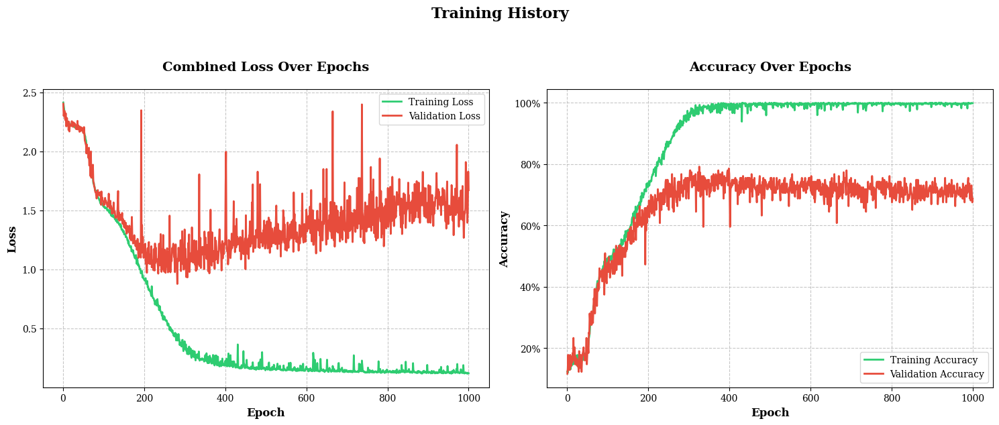

<Figure size 640x480 with 0 Axes>

In [39]:
# Load the JSON
with open(os.path.join(VAE_MODEL_DIR.format(GAMMA), 'training_history.json'), 'r') as f:
    loaded_history = json.load(f)

plot_training_history(loaded_history)

## Accuracy Report

Training Accuracy

In [40]:
class ZLA_EncoderWrapper(keras.layers.Layer):
    def __init__(self, encoder, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder

    def call(self, inputs):
        _, _, z_latent = self.encoder(inputs)
        return z_latent

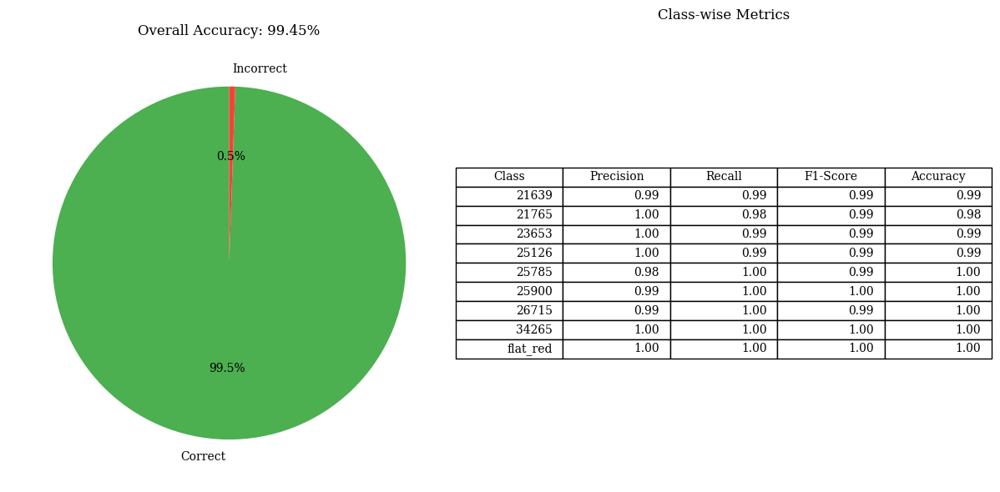

<Figure size 640x480 with 0 Axes>

In [41]:
# Load the best model by validation
encoder = define_encoder(latent_dim=LATENT_DIM, input_shape=x_train.shape[1:])
decoder = define_decoder(latent_dim=LATENT_DIM)
classifier = define_classifier(latent_dim=LATENT_DIM, num_classes=np.unique(y_train).shape[0])
vae_classifier = VAE_CLASSIFIER(encoder, decoder, classifier)

weights_path = os.path.join(VAE_MODEL_DIR.format(GAMMA), 'best_val_accuracy.weights.h5')
vae_classifier.load_weights(weights_path)

wrapped_encoder = Sequential([
    keras.Input(shape=x_train.shape[1:]),
    ZLA_EncoderWrapper(vae_classifier.encoder)
])

encoder_classifier = Sequential([
    wrapped_encoder,   # Add encoder
    vae_classifier.classifier  # Add classifier
])

classification_performance_summary(encoder_classifier, x_train, y_train, y_encoder)

Validation Accuracy

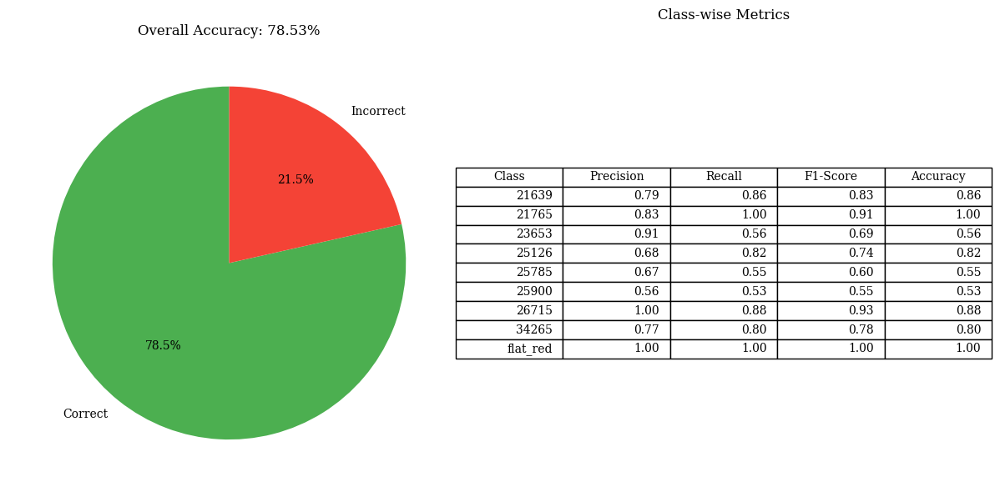

<Figure size 640x480 with 0 Axes>

In [42]:
classification_performance_summary(encoder_classifier, x_val, y_val, y_encoder)

Testing Accuracy

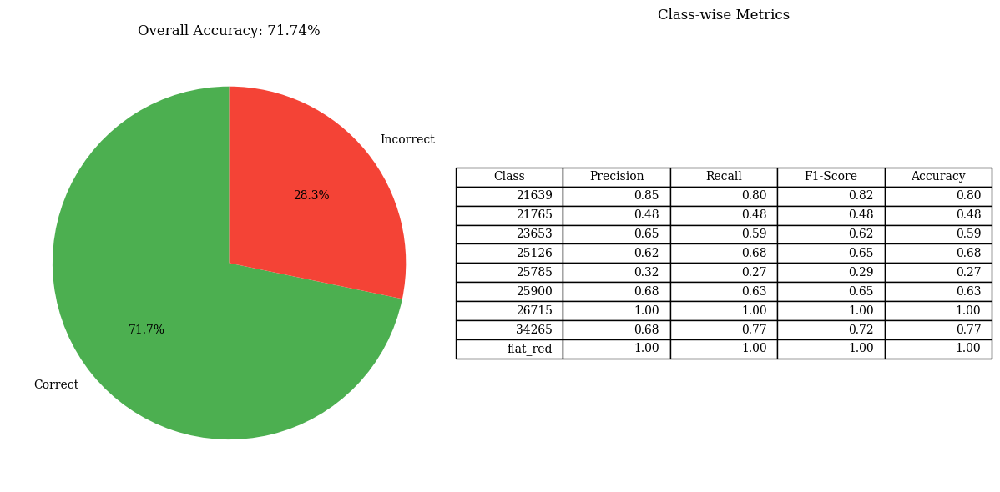

<Figure size 640x480 with 0 Axes>

In [43]:
classification_performance_summary(encoder_classifier, x_test, y_test, y_encoder)

## Trained Encoder (Z Latent)

In [44]:
TENC = wrapped_encoder

Highest compression z bottle-neck to 2D TNSE visualization

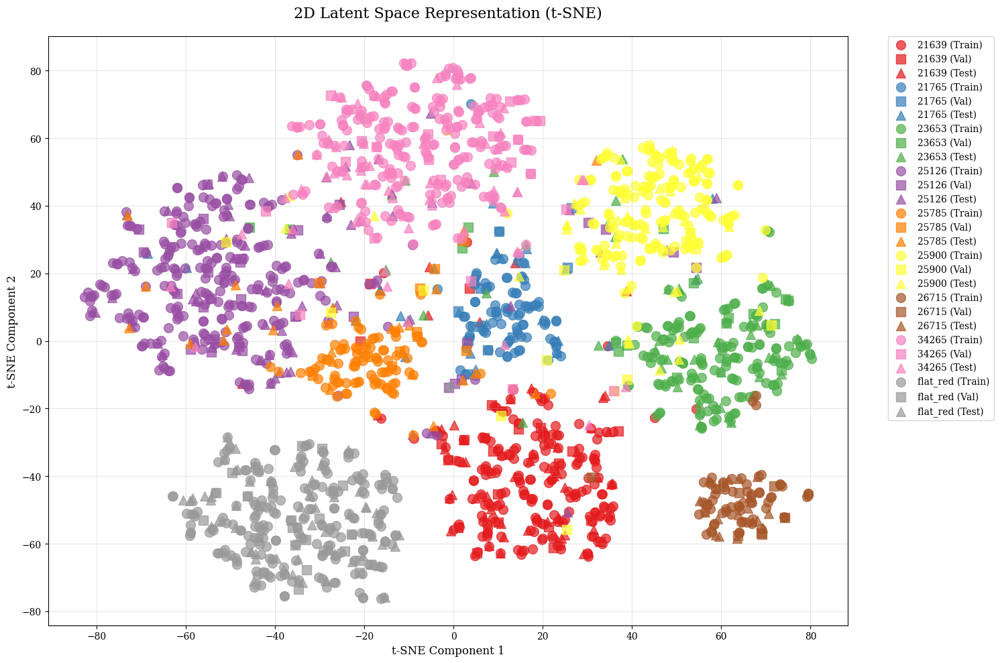

In [45]:
latent_viz_data = visualize_latent_space_2d(TENC, x_train, y_train, x_val, y_val, x_test, y_test, y_encoder)

Training Clustering Results:
Training Clustering Accuracy: 0.8135
Training Adjusted Rand Index: 0.8269
Training Accuracy


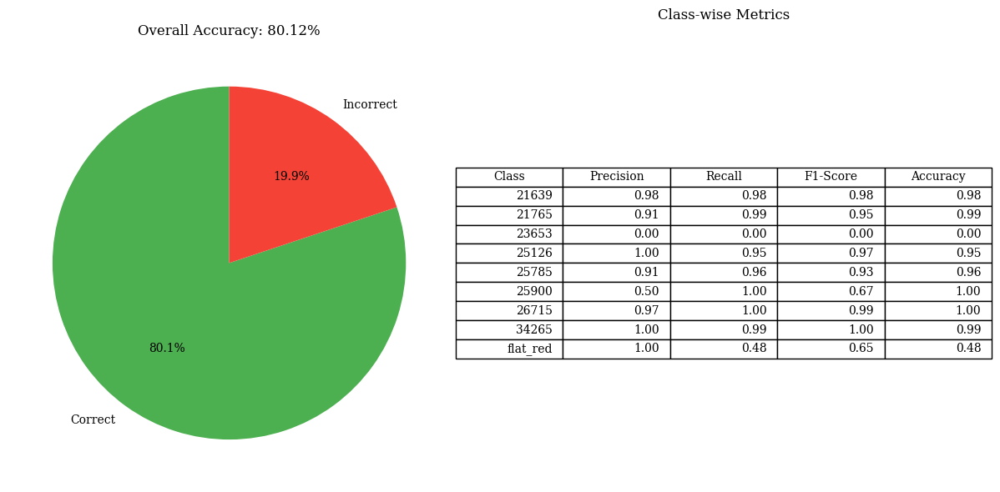

Validation Accuracy


<Figure size 640x480 with 0 Axes>

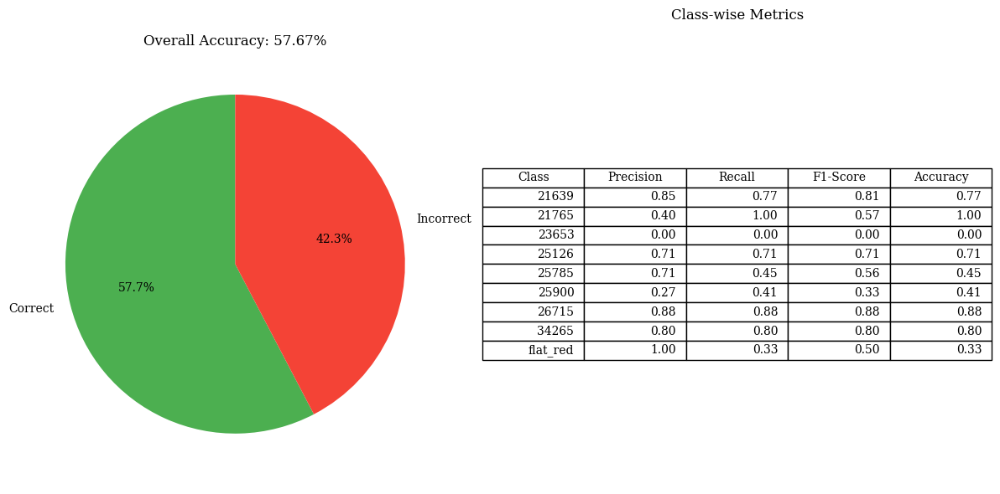

Testing Accuracy


<Figure size 640x480 with 0 Axes>

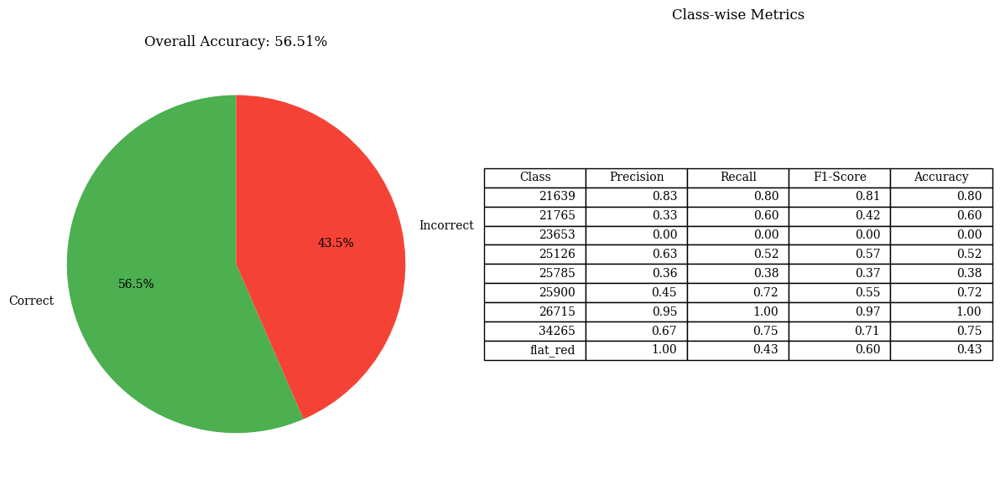

<Figure size 640x480 with 0 Axes>

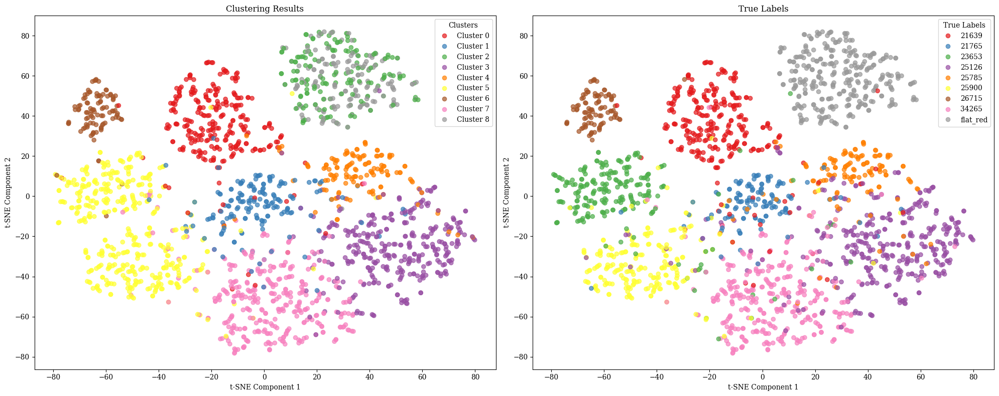

In [46]:
# First, train the clustering model on training data only
train_results = cluster_and_evaluate(TENC, x_train, y_train, n_clusters=np.unique(y_train).shape[0])

# Print training clustering results
print("Training Clustering Results:")
print(f"Training Clustering Accuracy: {train_results['clustering_accuracy']:.4f}")
print(f"Training Adjusted Rand Index: {train_results['ari_score']:.4f}")

# Create and fit the classifier using only training data
cluster_classifier = ClusteringClassifier(TENC, kmeans=train_results['kmeans_model'])

# Fit the label mapping using only training data
cluster_classifier.fit(x_train, y_train)
print("Training Accuracy")
classification_performance_summary(cluster_classifier, x_train, y_train, y_encoder, learn=True)
print("Validation Accuracy")
classification_performance_summary(cluster_classifier, x_val, y_val, y_encoder, learn=True)
print("Testing Accuracy")
classification_performance_summary(cluster_classifier, x_test, y_test, y_encoder, learn=True)

# Visualize results on all data for comparison
x_combined = np.vstack([x_train, x_val, x_test])
y_combined = np.concatenate([y_train, y_val, y_test])

# Get predictions for all data
y_pred_combined = cluster_classifier.predict(x_combined)
visualize_clusters(TENC, x_data=x_combined, cluster_labels=y_pred_combined, true_labels=y_combined, label_encoder=y_encoder)

## Trained Encoder (Z Mean)

In [47]:
class ZME_EncoderWrapper(keras.layers.Layer):
    def __init__(self, encoder, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder

    def call(self, inputs):
        z_mean, _, _ = self.encoder(inputs)
        return z_mean

In [48]:
wrapped_encoder = Sequential([
    keras.Input(shape=x_train.shape[1:]),
    ZME_EncoderWrapper(vae_classifier.encoder)
])

TENC = wrapped_encoder

Highest compression z bottle-neck to 2D TNSE visualization

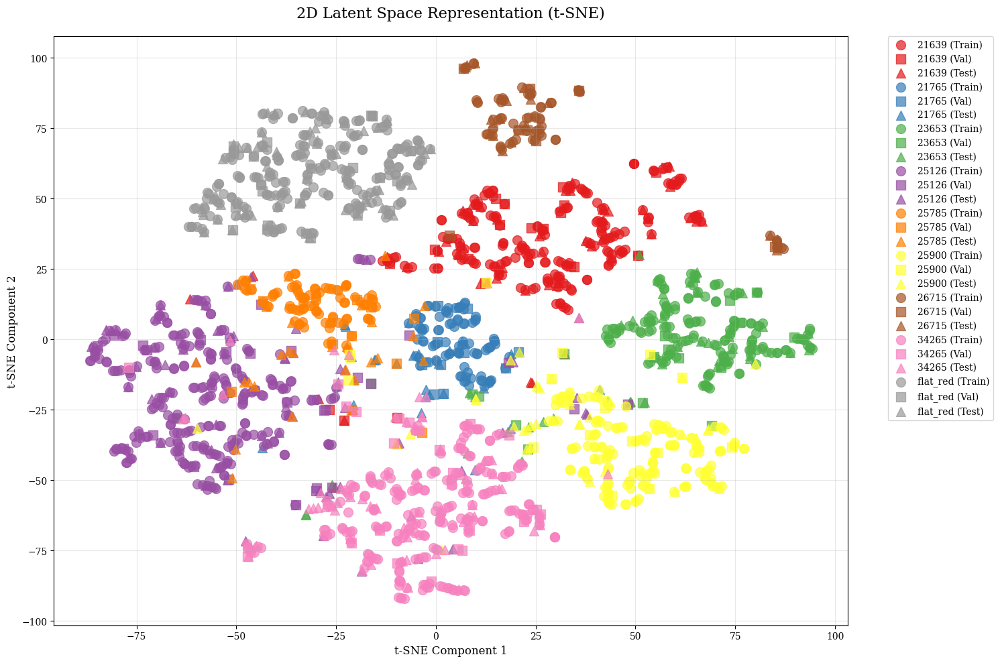

In [49]:
latent_viz_data = visualize_latent_space_2d(TENC, x_train, y_train, x_val, y_val, x_test, y_test, y_encoder)

Training Clustering Results:
Training Clustering Accuracy: 0.9952
Training Adjusted Rand Index: 0.9895
Training Accuracy


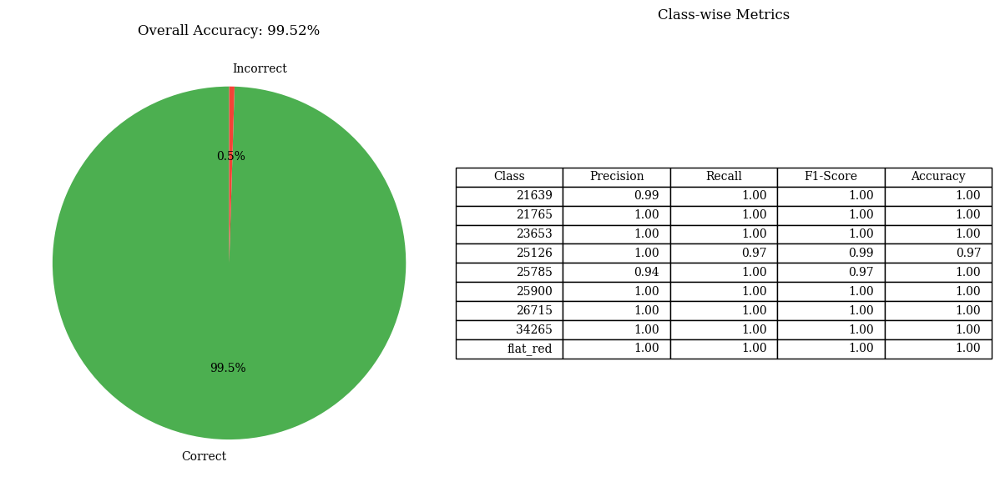

Validation Accuracy


<Figure size 640x480 with 0 Axes>

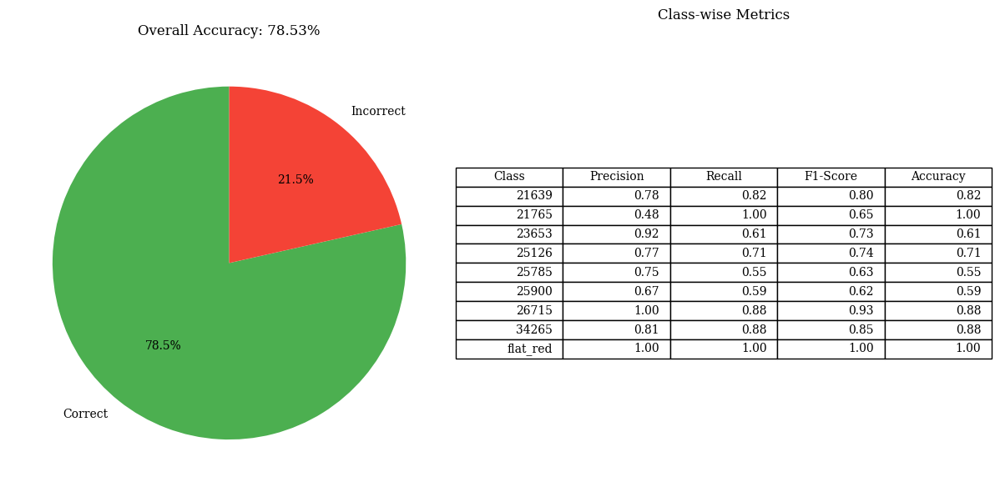

Testing Accuracy


<Figure size 640x480 with 0 Axes>

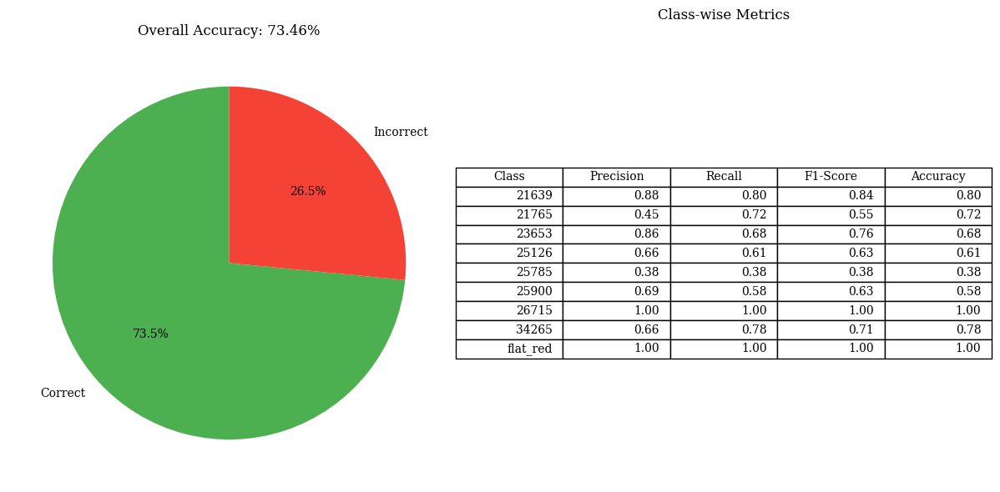

<Figure size 640x480 with 0 Axes>

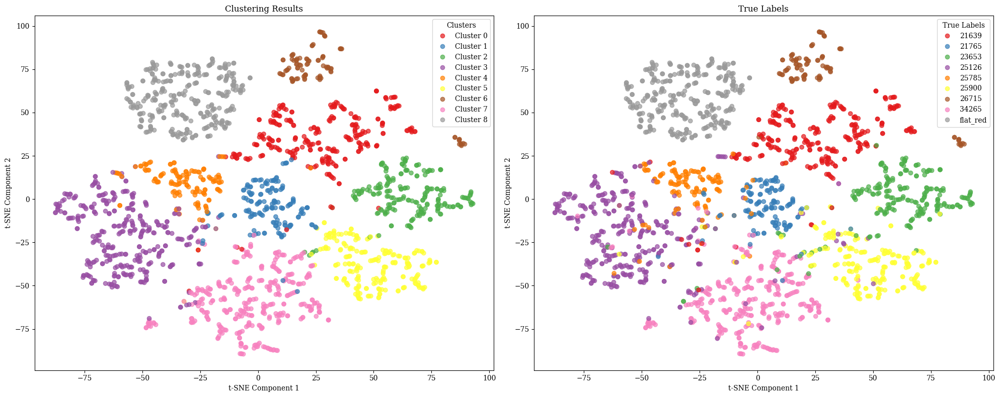

In [50]:
# First, train the clustering model on training data only
train_results = cluster_and_evaluate(TENC, x_train, y_train, n_clusters=np.unique(y_train).shape[0])

# Print training clustering results
print("Training Clustering Results:")
print(f"Training Clustering Accuracy: {train_results['clustering_accuracy']:.4f}")
print(f"Training Adjusted Rand Index: {train_results['ari_score']:.4f}")

# Create and fit the classifier using only training data
cluster_classifier = ClusteringClassifier(TENC, kmeans=train_results['kmeans_model'])

# Fit the label mapping using only training data
cluster_classifier.fit(x_train, y_train)
print("Training Accuracy")
classification_performance_summary(cluster_classifier, x_train, y_train, y_encoder, learn=True)
print("Validation Accuracy")
classification_performance_summary(cluster_classifier, x_val, y_val, y_encoder, learn=True)
print("Testing Accuracy")
classification_performance_summary(cluster_classifier, x_test, y_test, y_encoder, learn=True)

# Visualize results on all data for comparison
x_combined = np.vstack([x_train, x_val, x_test])
y_combined = np.concatenate([y_train, y_val, y_test])

# Get predictions for all data
y_pred_combined = cluster_classifier.predict(x_combined)
visualize_clusters(TENC, x_data=x_combined, cluster_labels=y_pred_combined, true_labels=y_combined, label_encoder=y_encoder)